In [1]:
!nvidia-smi

Wed Dec  3 21:20:31 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 580.82.07              Driver Version: 580.82.07      CUDA Version: 13.0     |
+-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA GeForce RTX 2080 Ti     Off |   00000000:B2:00.0 Off |                  N/A |
| 22%   24C    P8             18W /  250W |       4MiB /  11264MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [2]:
import os
# NOTE!
# this is for a multi-gpu setup. we basically set which GPU is visible for the program.
# if you only have one GPU (most likely the case ;) ), make sure this is set to "0"!
# or remove this line completely!
# otherwise you may accidentally make your GPU "invisible" to the program!
os.environ["CUDA_VISIBLE_DEVICES"] = "0"

# Vector-Quantized Variational Autoencoder + GAN

In [3]:
import os
os.chdir("/home/exgr5/LGM/Assignments")
print(os.getcwd())

/home/exgr5/LGM/Assignments


In [4]:
import numpy as np
import torch
from matplotlib import pyplot as plt
from torch import nn
from torchvision.transforms.v2 import Resize

from lgm.common import count_parameters, plot_learning_curves, EMA, Checkpointer
from lgm.data import get_datasets_and_loaders
from lgm.evaluation import fid_reconstructions, get_resnet
from lgm.gan import Discriminator, SDLayer
from lgm.layers import CNNBody, ConvBlockPrenorm
from lgm.vqgan import VQGANTrainer, VQGAN, VQVAE, VectorQuantizer

torch.set_float32_matmul_precision('high')
torch.backends.cudnn.benchmark = True

/home/exgr5/LGM/lib/python3.12/site-packages/torch/__init__.py:1617: UserWarning: Please use the new API settings to control TF32 behavior, such as torch.backends.cudnn.conv.fp32_precision = 'tf32' or torch.backends.cuda.matmul.fp32_precision = 'ieee'. Old settings, e.g, torch.backends.cuda.matmul.allow_tf32 = True, torch.backends.cudnn.allow_tf32 = True, allowTF32CuDNN() and allowTF32CuBLAS() will be deprecated after Pytorch 2.9. Please see https://pytorch.org/docs/main/notes/cuda.html#tensorfloat-32-tf32-on-ampere-and-later-devices (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:80.)
  _C._set_float32_matmul_precision(precision)


## Data

To nudge you towards somewhat larger datasets, we propose here using STL10.
These are CIFAR-like images, but at 96x96 resolution. To keep things more manageable, we resize to 64x64 pixels.
Note that this dataset is quite challenging due to the variety and fine details.
If you are struggling to get good results, perhaps try one of the face datasets below.

You can of course do your initial prototyping on different/smaller datasets (or downsize to 32x32, for example).
Other options for larger images are `celeba` (though you might not be able to download it sometimes) or `flickr`.
The latter requires a manual download -- please see the documentation in `lgm.data.datasets`.

Also, chances are **you will have to reduce the batch size** to fit on a 2080Ti, especially when using a GAN loss.
For some reason, this consumes huge amounts of RAM, to the point that there may be some configuration issue we might still be able to fix.
If you reduce the batch size, keep in mind you may want to reduce the number of epochs, as smaller batches imply more steps per epoch.
As an example, a batch size of 64 should hopefully fit on a 2080Ti using the parameters provided here.
In that case, you might want to cut the number of epochs in half or so.

Finally, keep in mind that you may have to adapt `num_workers`! 

Shape/dtype of batch X [N, C, H, W]: torch.Size([64, 3, 64, 64]), torch.float32
Shape/dtype of batch y: torch.Size([64]), torch.int64


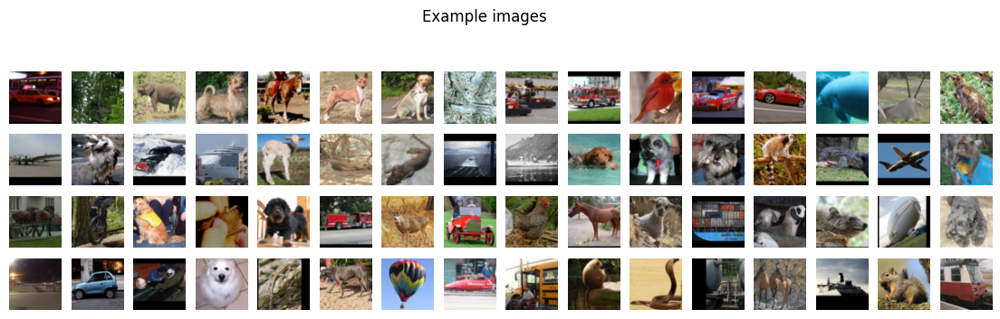

In [5]:
data = "stl10"
batch_size = 64

train_data, test_data, train_dataloader, test_dataloader = get_datasets_and_loaders(data, batch_size, num_workers=8,
                                                                                    additional_transforms=[Resize(64)])

## Model

I did not experiment much with the architecture. You can try keeping this fairly small.
E.g. you could reduce the number of filters in the first level to 32 or so, and everything else accordingly.
This example with four levels would downsample from 64x64 to 8x8.
When using smaller images, you can reduce the number of levels.

Note the extra `code_dim`. The reason for this is that VQ-VAEs have trouble "filling out" high-dimensional spaces with a limited number of codebook vectors.
As such, smaller dimensions are often sufficient, as larger ones bring no benefit.
For example, I tried `code_dim = 48`, but I did not tune this at all, so maybe try something else.
I also tried reducing the final `level_filters` to 256 and saw no adverse effects, so you might do that to reduce the number of parameters.
It didn't really speed up training, however.
On the other hand, a deeper model (e.g. more `blocks_per_level`) may unlock additional reconstruction quality.
This is especially true for STL10.

The remainder of this is mostly the typical autoencoder copy&paste.
Take note of the `quantizer` definition.
A codebook size of 1024 is a reasonable standard. Much larger, and we quickly run into diminishing returns with ballooning memory costs.
You could even try a smaller one, but expect performance to be worse.
We also set the quantizer to reset unused vectors once per epoch (`len(train_dataloader)` is the number of batches per epoch).
I did not experiment with the threshold.

In [6]:
device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Using {device} device\n")

level_filters = [48, 96, 192, 384]
level_strides = [1] +  [2] * (len(level_filters) - 1)
blocks_per_level = 1
kernel_size = 3
activation = nn.Mish
n_levels = len(level_filters)

code_dim = 32

input_shape = next(iter(train_dataloader))[0].shape[1:]
input_pixels = input_shape[1]
final_pixels = input_pixels // np.prod(level_strides)

input_channels = input_shape[0]
final_filters = level_filters[-1] 

block_fn = ConvBlockPrenorm
block_kwargs = {"n_layers": 2, "activation": activation, "kernel_size": kernel_size,
                "use_se": True, "se_reduction_factor": 8, "se_bias": 1.,
                "use_residual": True, "bottleneck_factor": 1}

encoder = nn.Sequential()
encoder.append(nn.Conv2d(input_channels, level_filters[0], kernel_size, padding="same"))
encoder.append(CNNBody(blocks_per_level, level_filters, level_strides,
                       input_channels=level_filters[0],
                       direction="down", block_fn=block_fn, **block_kwargs))

encoder.append(nn.Conv2d(final_filters, code_dim, 1))


decoder = nn.Sequential()
decoder.append(nn.Conv2d(code_dim, final_filters, 1))
decoder.append(CNNBody(blocks_per_level, list(reversed(level_filters)), list(reversed(level_strides)),
                       input_channels=final_filters,
                       direction="up", block_fn=block_fn, **block_kwargs))
decoder.append(nn.Conv2d(level_filters[0], input_channels, 1))


codebook_size = 1024
average = batch_size*final_pixels**2 / codebook_size
quantizer = VectorQuantizer(code_dim, codebook_size, 0.99, reset_frequency=len(train_dataloader), reset_threshold=1/50*average)

likelihood = "laplace"  # corresponds to absolute error
vqvae = VQVAE(encoder, decoder, quantizer, likelihood)

vqvae = vqvae.to(device).eval()
with torch.no_grad():
    dummy = next(iter(train_dataloader))[0].to(device)
    test_output = vqvae(dummy, map_to_expected=True)

print("test output shape")
print(test_output.shape, "\n")
if test_output.shape[1] != input_channels:
    raise ValueError(f"WARNING! Expected {input_channels} output channels but got {test_output.shape[1]}")
if test_output.shape[2] != input_pixels:
    raise ValueError(f"WARNING! Expected {input_pixels} output pixels but got {test_output.shape[2]}")

print(vqvae)

Using cuda device

test output shape
torch.Size([64, 3, 64, 64]) 

VQVAE(
  (encoder): Sequential(
    (0): Conv2d(3, 48, kernel_size=(3, 3), stride=(1, 1), padding=same)
    (1): CNNBody(
      (levels): ModuleList(
        (0): CNNLevel(
          (blocks): ModuleList(
            (0): ConvBlockPrenorm(
              (first_norm): BNWrap2d(48, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
              (layers): Sequential(
                (0): Mish()
                (1): Conv2d(48, 48, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
                (2): BNWrap2d(48, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
                (3): Mish()
                (4): Conv2d(48, 48, kernel_size=(3, 3), stride=(1, 1), padding=same, bias=False)
              )
              (squeeze_excite): SqueezeExcite(
                (mapper): Sequential(
                  (0): Linear(in_features=48, out_features=6, bias=True)
                  (1): Mish(

The codebook gets initialized with standard normal random values. But that might not be a good fit for what the encoder is outputting. Therefore, we put one batch of data through the encoder, and run k-means on those outputs. This should give a better initialization for the cod

In [7]:
with torch.no_grad():
    quantizer.init_k_means(encoder(dummy))

Initializing codebook with K-Means!


Next, we build the GAN discriminator. For your initial tests, you likely want to set `gan_loss_scale=0` for the trainer to turn this off. This will massively speed up training!
In that case, you can build pretty much whatever you want in here, as the model won't be used anyway. But you do need *something* to comply with the interface.

We build a fairly small fully-convolutional model.
This corresponds to a "PatchGAN" that outputs a whole _image_ of real/fake predictions, that are each based on a limited convolutional receptive field.
This should focus discriminator decisions more on local factors like textures, sharp edges etc., and less so on global object shapes.
But since we are using the autoencoder to match object shapes, this should be fine.

In [8]:
level_filters = [48, 96, 192]  # double number of filters each level
level_strides = [1] +  [2] * (len(level_filters) - 1)
blocks_per_level = 2
kernel_size = 3
activation = nn.Mish
n_levels = len(level_filters)

disc_initial = nn.Conv2d(input_channels, level_filters[0], kernel_size, padding="same")
disc_body = CNNBody(blocks_per_level, level_filters, level_strides,
                    input_channels=level_filters[0],
                    direction="down", block_fn=block_fn, return_all=True,
                    norm=nn.GroupNorm, norm_groups=-8, **block_kwargs)
disc_head = nn.Sequential()
disc_head.append(SDLayer())
disc_head.append(nn.Conv2d(level_filters[-1] + 1, 1, 1))  # + 1 because of the SD layer

discriminator = Discriminator(disc_initial, disc_body, disc_head)

discriminator = discriminator.to(device)

with torch.no_grad():
    d_test_output = discriminator(next(iter(train_dataloader))[0].to(device))
print(d_test_output[0].shape)
print(discriminator)

model = VQGAN(vqvae, discriminator)
model.compile()

torch.Size([64, 1, 16, 16])
Discriminator(
  (root): Conv2d(3, 48, kernel_size=(3, 3), stride=(1, 1), padding=same)
  (body): CNNBody(
    (levels): ModuleList(
      (0): CNNLevel(
        (blocks): ModuleList(
          (0-1): 2 x ConvBlockPrenorm(
            (first_norm): GroupNorm(6, 48, eps=1e-05, affine=True)
            (layers): Sequential(
              (0): Mish()
              (1): Conv2d(48, 48, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
              (2): GroupNorm(6, 48, eps=1e-05, affine=True)
              (3): Mish()
              (4): Conv2d(48, 48, kernel_size=(3, 3), stride=(1, 1), padding=same, bias=False)
            )
            (squeeze_excite): SqueezeExcite(
              (mapper): Sequential(
                (0): Linear(in_features=48, out_features=6, bias=True)
                (1): Mish()
                (2): Linear(in_features=6, out_features=48, bias=True)
                (3): Sigmoid()
              )
            )
          )
      

In [9]:
num_params = count_parameters(vqvae)
print(f"VQVAE with {num_params:,d} trainable parameters!\n")

num_params = count_parameters(discriminator)
print(f"Discriminator with {num_params:,d} trainable parameters!\n")

num_params = count_parameters(model)
print(f"Full model with {num_params:,d} trainable parameters!")

VQVAE with 6,941,975 trainable parameters!

Discriminator with 1,587,062 trainable parameters!

Full model with 8,529,037 trainable parameters!


## Training



### VQ-VAE Model Training

Model trained with batchsize of 256

In [10]:
n_epochs = 125

optimizer = torch.optim.AdamW(model.parameters(), weight_decay=0.1, amsgrad=False)
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, n_epochs)

trainer = VQGANTrainer(beta=1., d_loss_fn=nn.MSELoss(), noise_scale=1/255., feature_matching="mean", gan_loss_scale=0.,
                       model=model, optimizer=optimizer, scheduler=scheduler,
                       training_loader=train_dataloader, validation_loader=test_dataloader,
                       n_epochs=n_epochs, device=device, plot_every_n_epochs=20, verbose=True,  tensorboard_logdir="./logs",  tensorboard_figures=True)

Running 125 epochs at 410 steps per epoch.


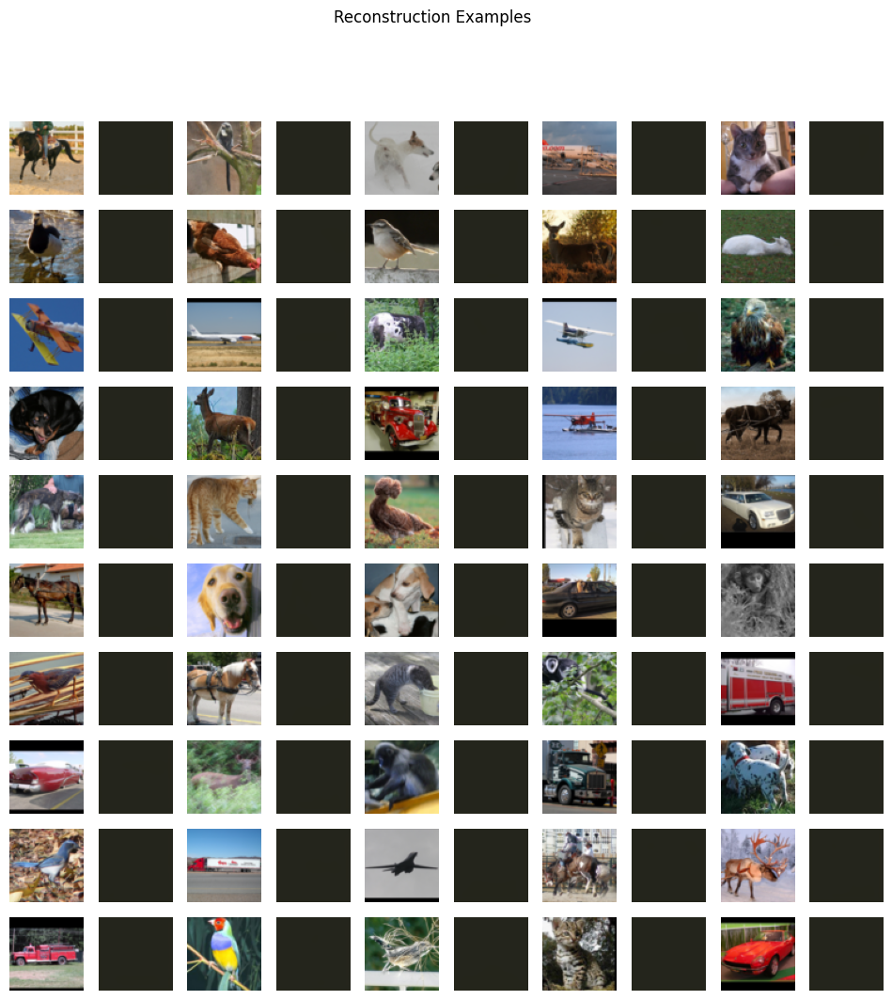

Starting epoch 1... 	Time taken: 141.9 seconds
	Metrics:
		val_discriminator_loss: 0
		train_discriminator_loss: 0
		val_commitment_loss: 32.3369
		train_commitment_loss: 86.5064
		val_reconstruction_loss: 880.532
		train_reconstruction_loss: 1204.77
		val_generator_loss_classification: 0
		train_generator_loss_classification: 0
		val_feature_matching_loss: 0
		train_feature_matching_loss: 0
	LR is now 0.0009998420946

Starting epoch 2... 	Time taken: 135.4 seconds
	Metrics:
		val_discriminator_loss: 0
		train_discriminator_loss: 0
		val_commitment_loss: 32.2947
		train_commitment_loss: 26.9754
		val_reconstruction_loss: 745.866
		train_reconstruction_loss: 790.537
		val_generator_loss_classification: 0
		train_generator_loss_classification: 0
		val_feature_matching_loss: 0
		train_feature_matching_loss: 0
	LR is now 0.0009993684783

Starting epoch 3... 	Time taken: 135.2 seconds
	Metrics:
		val_discriminator_loss: 0
		train_discriminator_loss: 0
		val_commitment_loss: 38.0263
		train_

In [ ]:
metrics = trainer.train_model()

### VQ-GAN Model Training 

We trained this model with a batch size of 64 and reduced the number of workers to 8. We also attempted using a batch size of 128, but it did not work (Out of Memory error).


Running 125 epochs at 1640 steps per epoch.


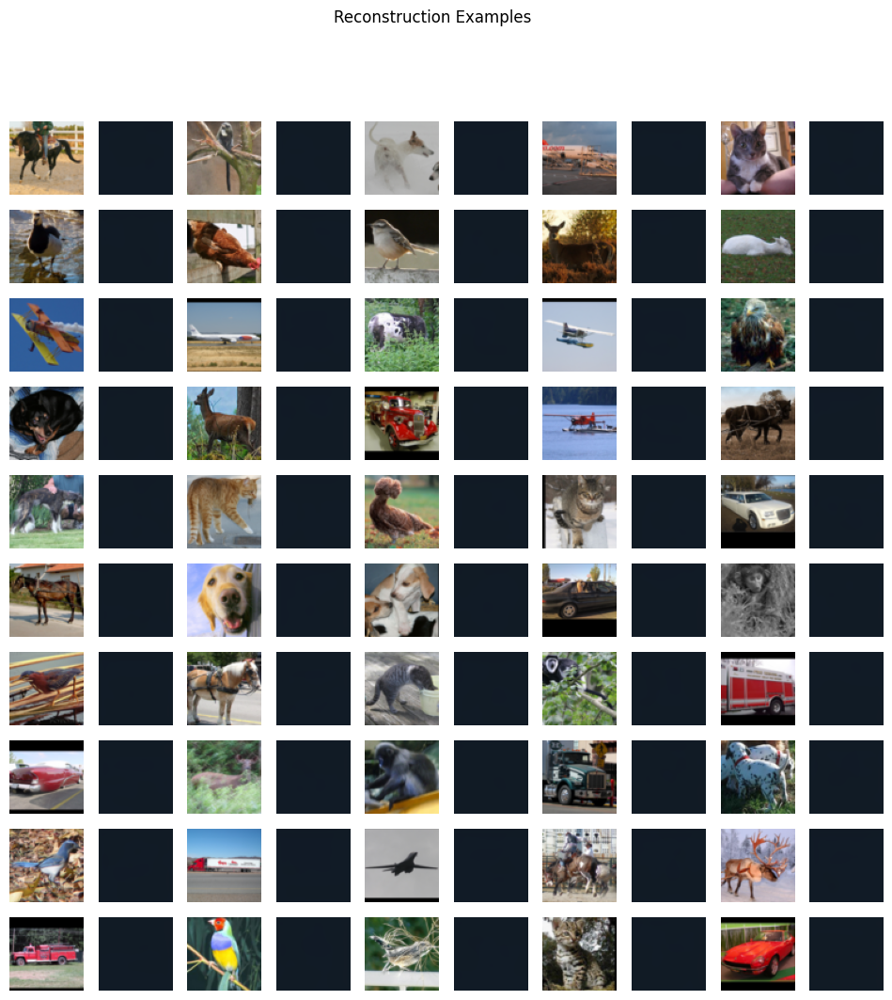

Starting epoch 1... 	Time taken: 411.7 seconds
	Metrics:
		val_discriminator_loss: 0.00167976
		train_discriminator_loss: 0.0451213
		val_commitment_loss: 43.7446
		train_commitment_loss: 69.0589
		val_reconstruction_loss: 770.808
		train_reconstruction_loss: 971.063
		val_generator_loss_classification: 0.918331
		train_generator_loss_classification: 0.885974
		val_feature_matching_loss: 69.0926
		train_feature_matching_loss: 72.5932
	LR is now 0.0009998420946

Starting epoch 2... 	Time taken: 409 seconds
	Metrics:
		val_discriminator_loss: 0.0148842
		train_discriminator_loss: 0.0112889
		val_commitment_loss: 59.1925
		train_commitment_loss: 47.655
		val_reconstruction_loss: 677.285
		train_reconstruction_loss: 724.772
		val_generator_loss_classification: 0.988451
		train_generator_loss_classification: 0.967405
		val_feature_matching_loss: 139.936
		train_feature_matching_loss: 120.4
	LR is now 0.0009993684783

Starting epoch 3... 	Time taken: 408.5 seconds
	Metrics:
		val_discriminat

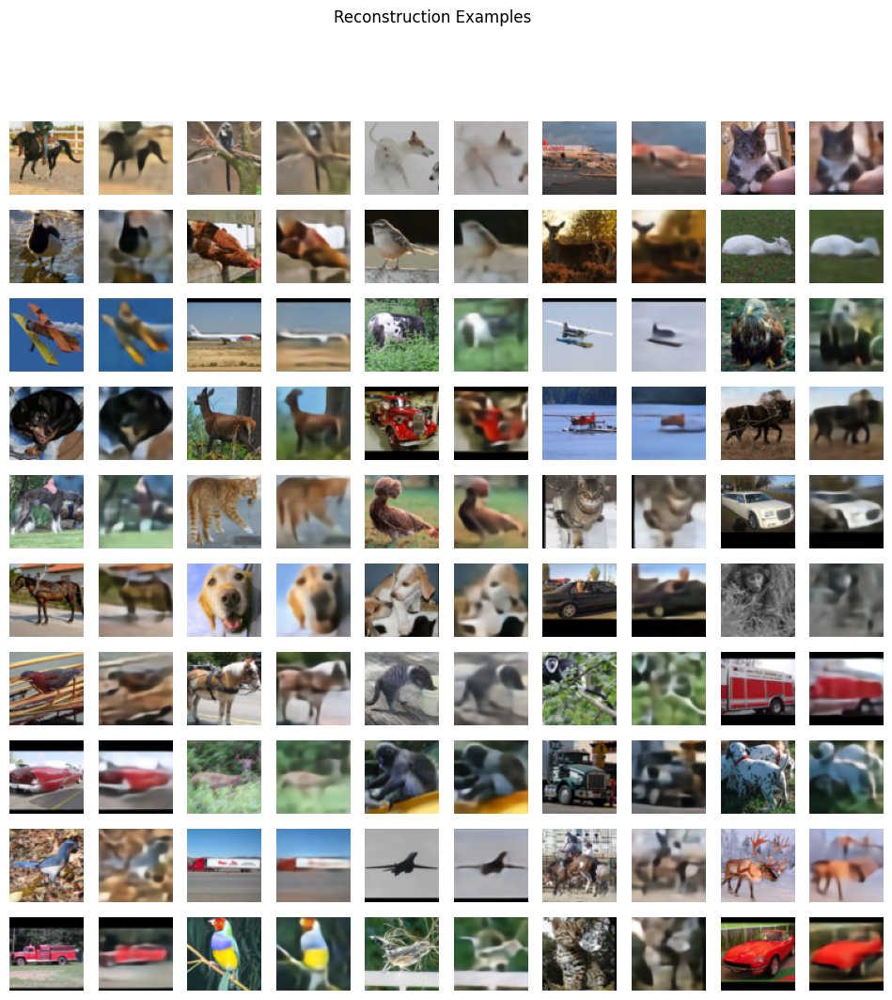

Starting epoch 21... 	Time taken: 409.1 seconds
	Metrics:
		val_discriminator_loss: 3.20196e-05
		train_discriminator_loss: 0.000507891
		val_commitment_loss: 75.6729
		train_commitment_loss: 76.8661
		val_reconstruction_loss: 614.071
		train_reconstruction_loss: 627.397
		val_generator_loss_classification: 1.00468
		train_generator_loss_classification: 0.998358
		val_feature_matching_loss: 9.94257
		train_feature_matching_loss: 10.4221
	LR is now 0.0009319617086

Starting epoch 22... 	Time taken: 409.3 seconds
	Metrics:
		val_discriminator_loss: 5.12875e-05
		train_discriminator_loss: 0.000395976
		val_commitment_loss: 78.3624
		train_commitment_loss: 77.2263
		val_reconstruction_loss: 601.54
		train_reconstruction_loss: 625.121
		val_generator_loss_classification: 0.993913
		train_generator_loss_classification: 0.998723
		val_feature_matching_loss: 7.44241
		train_feature_matching_loss: 8.85704
	LR is now 0.0009254972409

Starting epoch 23... 	Time taken: 409 seconds
	Metrics:
		val_

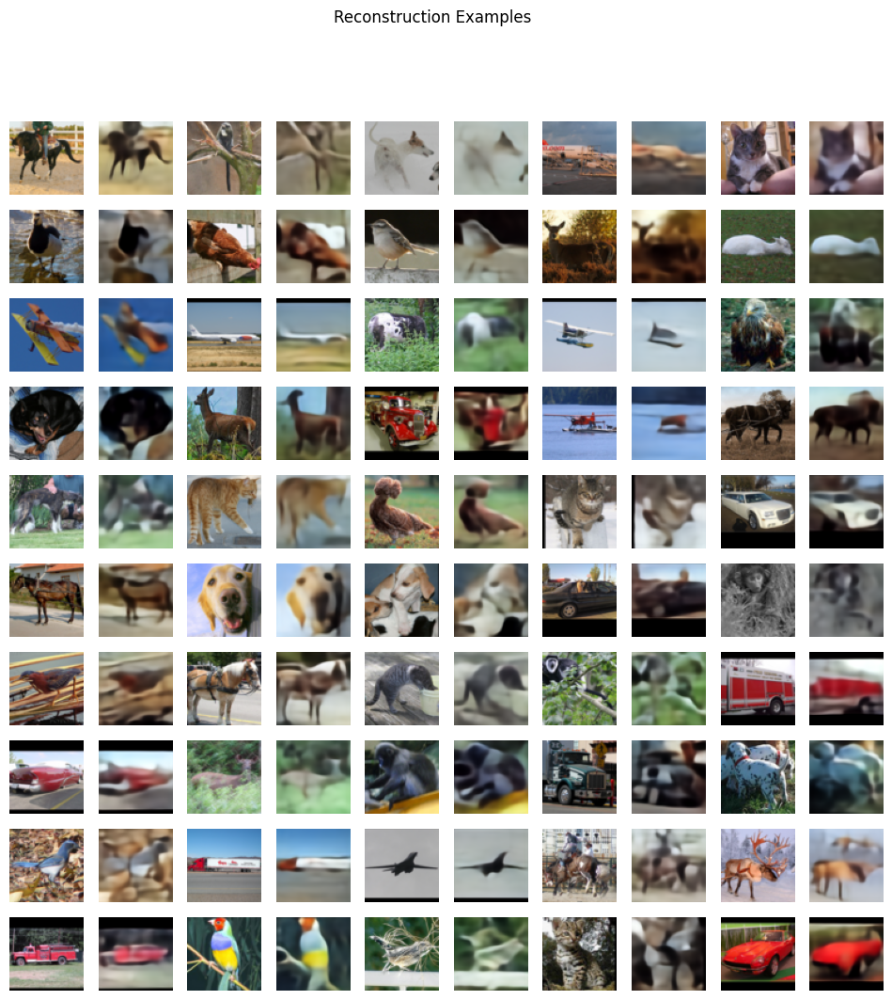

Starting epoch 41... 	Time taken: 408.4 seconds
	Metrics:
		val_discriminator_loss: 0.000199025
		train_discriminator_loss: 0.000277269
		val_commitment_loss: 77.1457
		train_commitment_loss: 78.3877
		val_reconstruction_loss: 613.378
		train_reconstruction_loss: 618.141
		val_generator_loss_classification: 1.00253
		train_generator_loss_classification: 0.999053
		val_feature_matching_loss: 3.65334
		train_feature_matching_loss: 4.09288
	LR is now 0.0007572197669

Starting epoch 42... 	Time taken: 408.3 seconds
	Metrics:
		val_discriminator_loss: 2.74564e-06
		train_discriminator_loss: 0.000380827
		val_commitment_loss: 80.6997
		train_commitment_loss: 78.1039
		val_reconstruction_loss: 614.709
		train_reconstruction_loss: 619.433
		val_generator_loss_classification: 0.999734
		train_generator_loss_classification: 0.998794
		val_feature_matching_loss: 5.70127
		train_feature_matching_loss: 4.70546
	LR is now 0.0007463636708

Starting epoch 43... 	Time taken: 408.7 seconds
	Metrics:
		v

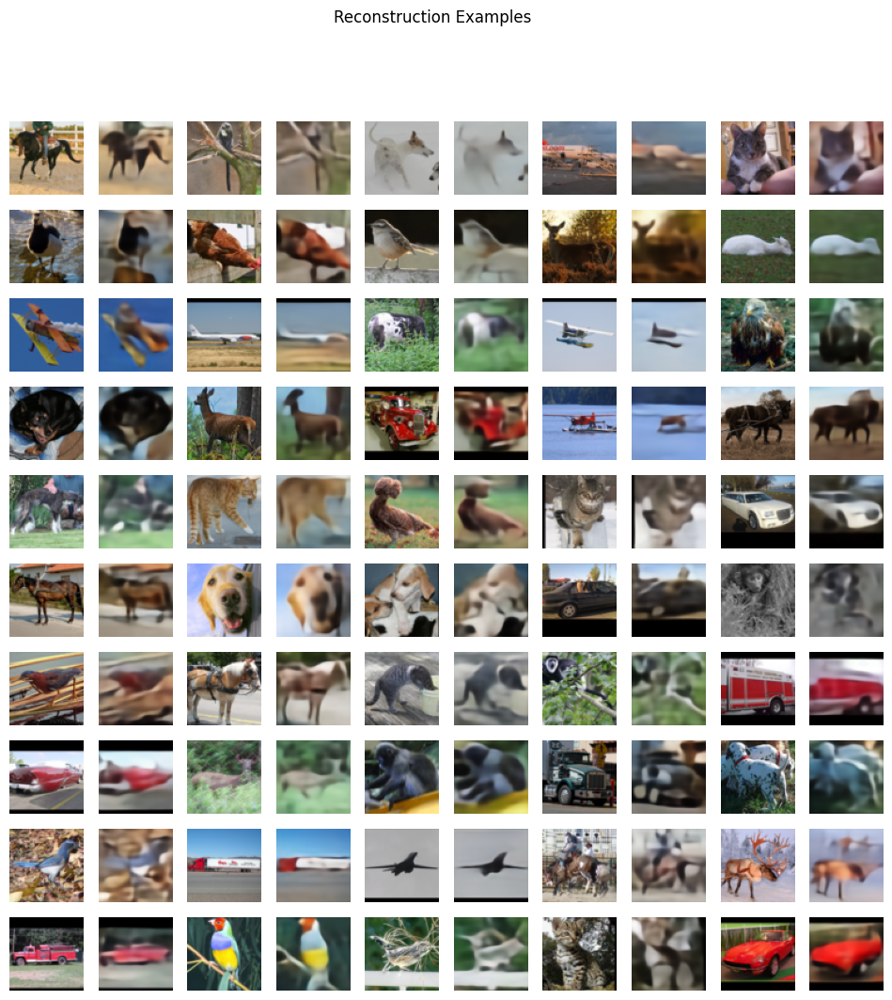

Starting epoch 61... 	Time taken: 409 seconds
	Metrics:
		val_discriminator_loss: 4.88046e-05
		train_discriminator_loss: 0.000234124
		val_commitment_loss: 81.8461
		train_commitment_loss: 79.4239
		val_reconstruction_loss: 616.856
		train_reconstruction_loss: 606.937
		val_generator_loss_classification: 1.01438
		train_generator_loss_classification: 0.999195
		val_feature_matching_loss: 1.62501
		train_feature_matching_loss: 1.94928
	LR is now 0.0005188450913

Starting epoch 62... 	Time taken: 409 seconds
	Metrics:
		val_discriminator_loss: 2.45542e-05
		train_discriminator_loss: 0.000247837
		val_commitment_loss: 79.2901
		train_commitment_loss: 79.3827
		val_reconstruction_loss: 589.431
		train_reconstruction_loss: 606.655
		val_generator_loss_classification: 1.00033
		train_generator_loss_classification: 0.99916
		val_feature_matching_loss: 1.83121
		train_feature_matching_loss: 1.81453
	LR is now 0.0005062830199

Starting epoch 63... 	Time taken: 409.3 seconds
	Metrics:
		val_dis

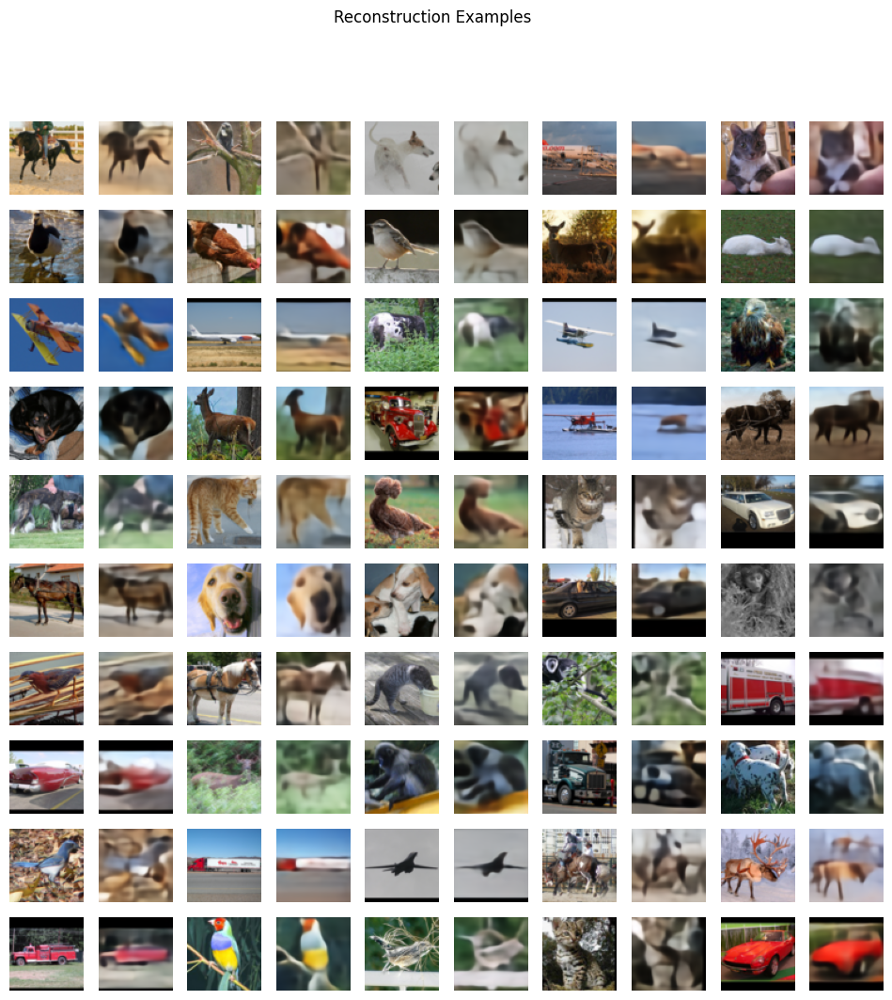

Starting epoch 81... 	Time taken: 407.5 seconds
	Metrics:
		val_discriminator_loss: 4.57745e-05
		train_discriminator_loss: 0.000143344
		val_commitment_loss: 80.4671
		train_commitment_loss: 80.8928
		val_reconstruction_loss: 589.379
		train_reconstruction_loss: 593.311
		val_generator_loss_classification: 0.992432
		train_generator_loss_classification: 0.999504
		val_feature_matching_loss: 0.635652
		train_feature_matching_loss: 0.777871
	LR is now 0.000275808392

Starting epoch 82... 	Time taken: 408.1 seconds
	Metrics:
		val_discriminator_loss: 1.4043e-06
		train_discriminator_loss: 0.000137248
		val_commitment_loss: 81.3951
		train_commitment_loss: 81.0091
		val_reconstruction_loss: 588.826
		train_reconstruction_loss: 593.205
		val_generator_loss_classification: 0.999961
		train_generator_loss_classification: 0.999528
		val_feature_matching_loss: 0.832847
		train_feature_matching_loss: 0.728801
	LR is now 0.0002646480339

Starting epoch 83... 	Time taken: 407.9 seconds
	Metrics:


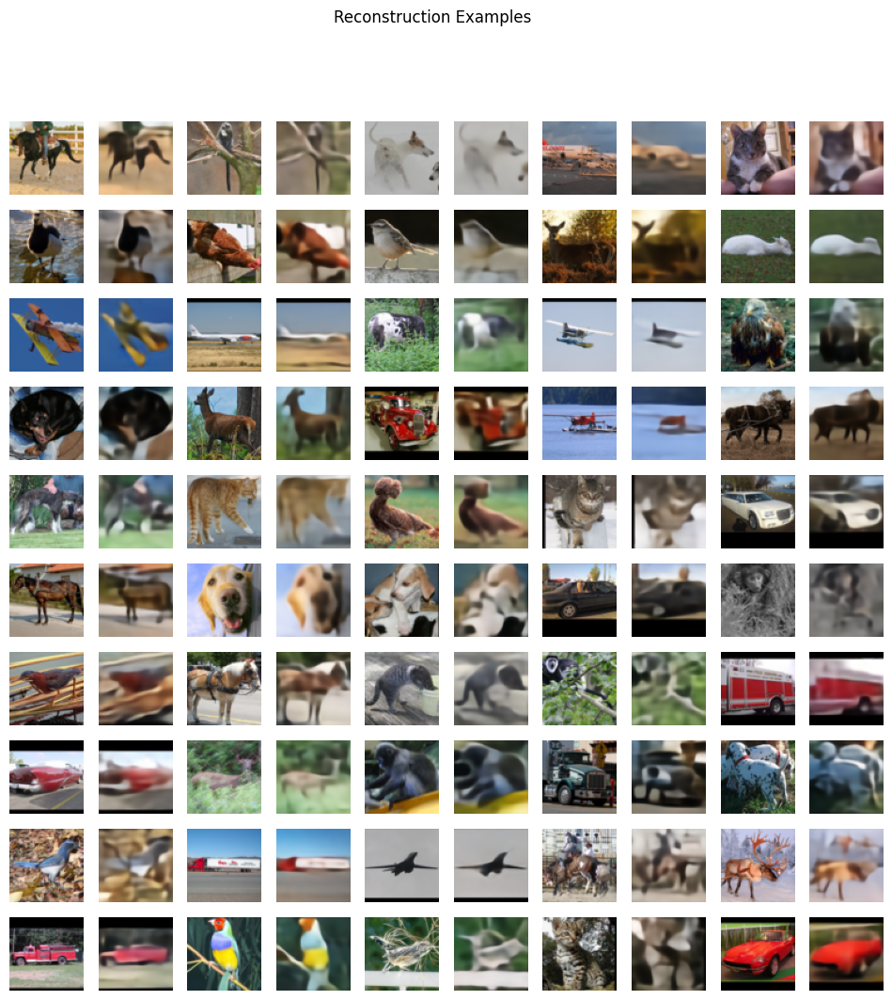

Starting epoch 101... 	Time taken: 409.7 seconds
	Metrics:
		val_discriminator_loss: 2.14752e-05
		train_discriminator_loss: 6.65937e-05
		val_commitment_loss: 82.2491
		train_commitment_loss: 82.6774
		val_reconstruction_loss: 577.508
		train_reconstruction_loss: 579.584
		val_generator_loss_classification: 0.999777
		train_generator_loss_classification: 0.999769
		val_feature_matching_loss: 0.345599
		train_feature_matching_loss: 0.373244
	LR is now 8.823370119e-05

Starting epoch 102... 	Time taken: 408.9 seconds
	Metrics:
		val_discriminator_loss: 3.21979e-06
		train_discriminator_loss: 6.73501e-05
		val_commitment_loss: 85.418
		train_commitment_loss: 82.8417
		val_reconstruction_loss: 569.622
		train_reconstruction_loss: 577.601
		val_generator_loss_classification: 0.999658
		train_generator_loss_classification: 0.999778
		val_feature_matching_loss: 0.405964
		train_feature_matching_loss: 0.370631
	LR is now 8.123597998e-05

Starting epoch 103... 	Time taken: 409 seconds
	Metrics

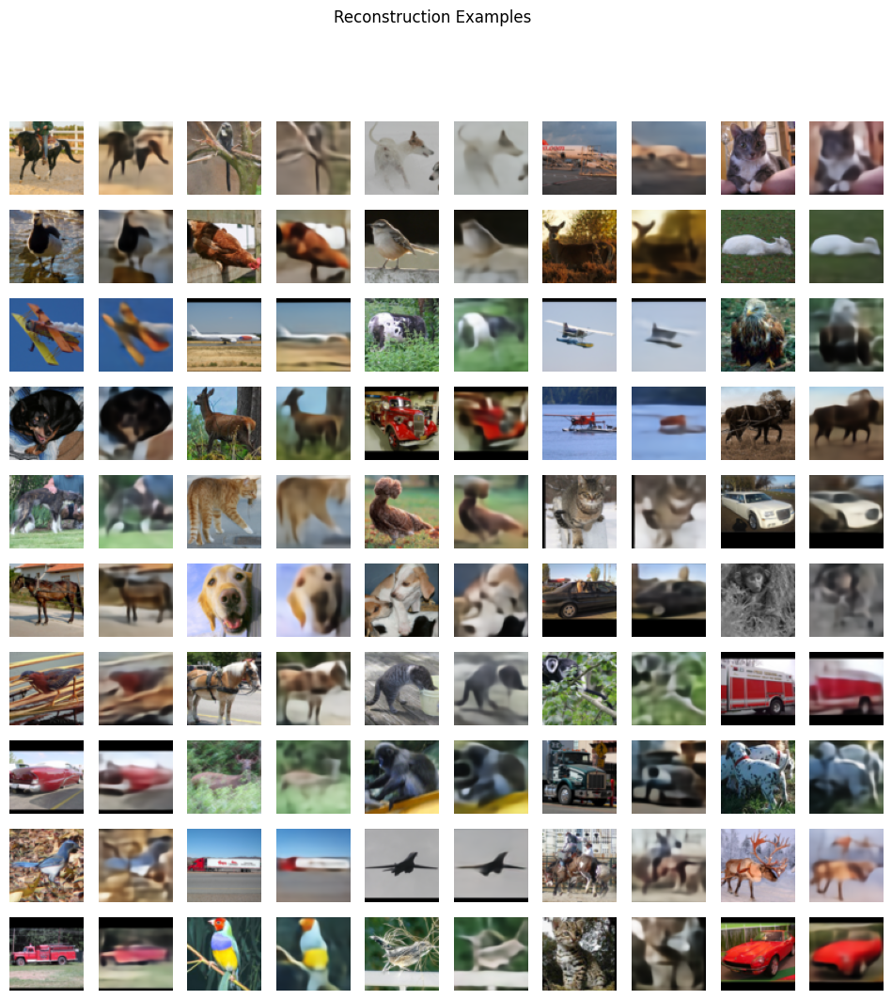

Starting epoch 121... 	Time taken: 408.9 seconds
	Metrics:
		val_discriminator_loss: 5.00396e-07
		train_discriminator_loss: 3.4391e-06
		val_commitment_loss: 84.5369
		train_commitment_loss: 84.357
		val_reconstruction_loss: 560.724
		train_reconstruction_loss: 567.087
		val_generator_loss_classification: 1.00001
		train_generator_loss_classification: 0.999997
		val_feature_matching_loss: 0.350109
		train_feature_matching_loss: 0.346045
	LR is now 2.524491509e-06

Starting epoch 122... 	Time taken: 408.9 seconds
	Metrics:
		val_discriminator_loss: 1.21257e-07
		train_discriminator_loss: 5.30498e-06
		val_commitment_loss: 84.9027
		train_commitment_loss: 84.3881
		val_reconstruction_loss: 560.566
		train_reconstruction_loss: 567.172
		val_generator_loss_classification: 0.999996
		train_generator_loss_classification: 0.999977
		val_feature_matching_loss: 0.347211
		train_feature_matching_loss: 0.347995
	LR is now 1.42054987e-06

Starting epoch 123... 	Time taken: 408.5 seconds
	Metrics:

In [10]:
n_epochs = 125

optimizer = torch.optim.AdamW(model.parameters(), weight_decay=0.1, amsgrad=False)
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, n_epochs)


= VQGANTrainer(beta=1., d_loss_fn=nn.MSELoss(), noise_scale=1/255., feature_matching="mean", gan_loss_scale=0.10,
                       model=model, optimizer=optimizer, scheduler=scheduler,
                       training_loader=train_dataloader, validation_loader=test_dataloader,
                       n_epochs=n_epochs, device=device, plot_every_n_epochs=20, verbose=True,  tensorboard_logdir="./Vq_gan_logs",  tensorboard_figures=True)
gan_metrics = gan_trainer.train_model()

## VQ-VAE RESULTS 

With `gan_loss_scale = 0`, we hae observed that the reconstuction results were blurry and FID Score was also higher. 

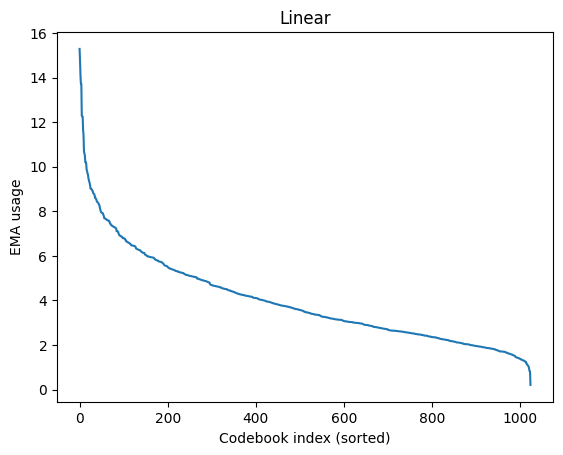

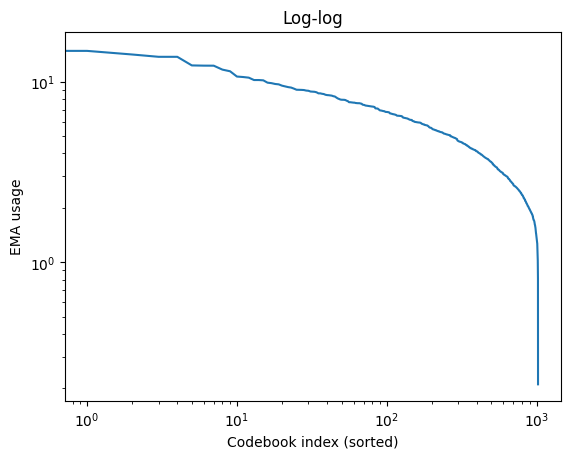

In [18]:
plt.plot(sorted(model.vqvae.quantizer.n_averages.cpu(), reverse=True))
plt.xlabel("Codebook index (sorted)")
plt.ylabel("EMA usage")
plt.title("Linear")
plt.show()

plt.loglog(sorted(model.vqvae.quantizer.n_averages.cpu(), reverse=True))
plt.xlabel("Codebook index (sorted)")
plt.ylabel("EMA usage")
plt.title("Log-log")
plt.show()

In [14]:
evaluation_results = trainer.evaluate()
print(evaluation_results[1])

defaultdict(<class 'float'>, {'discriminator_loss': tensor(0.), 'commitment_loss': tensor(71.6987, device='cuda:0'), 'reconstruction_loss': tensor(554.7011, device='cuda:0'), 'generator_loss_classification': tensor(0.), 'feature_matching_loss': tensor(0.)})


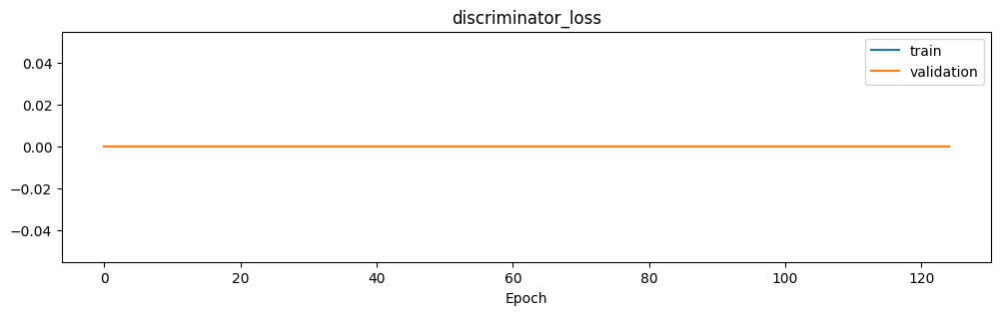

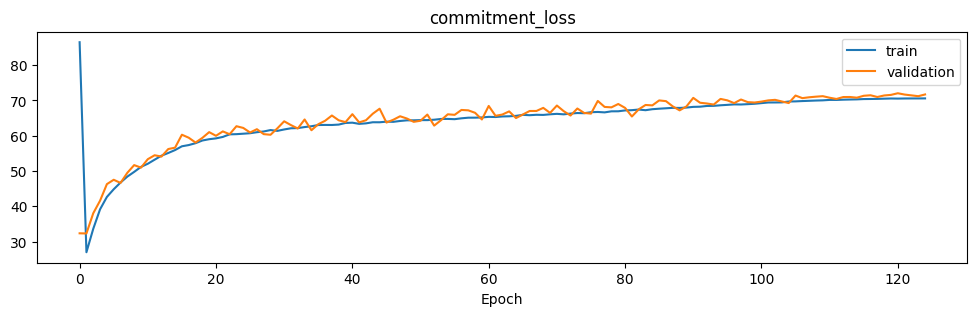

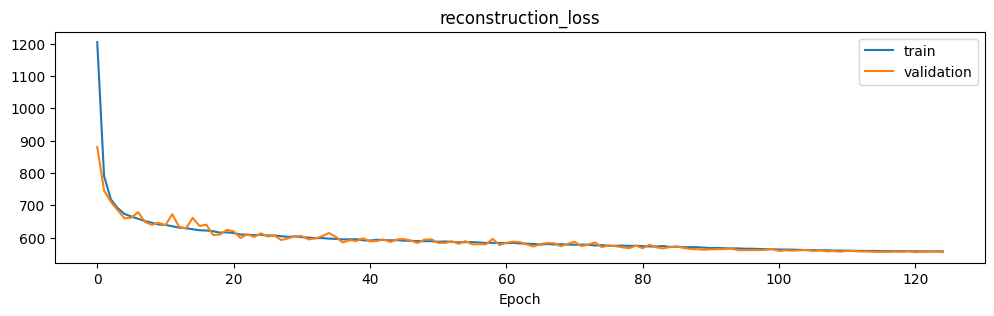

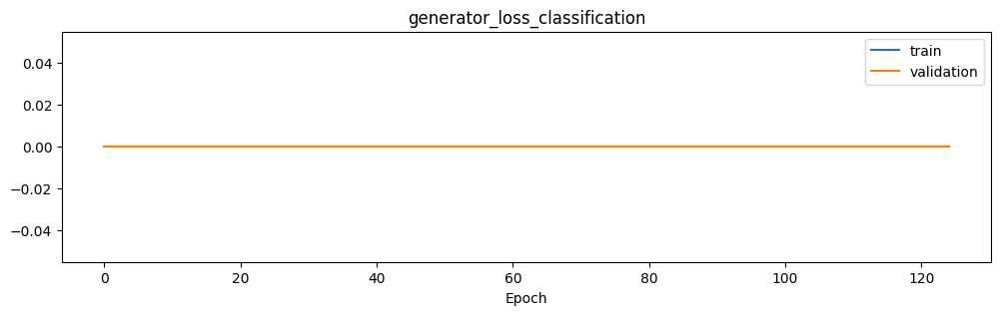

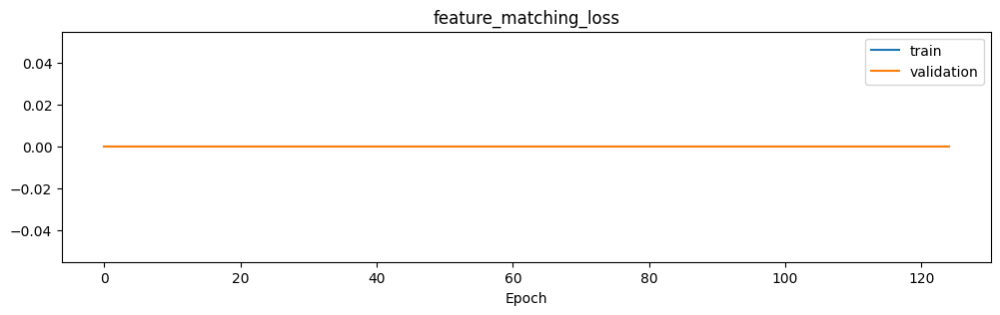

In [15]:
plot_learning_curves(metrics, evaluation_results[1].keys())

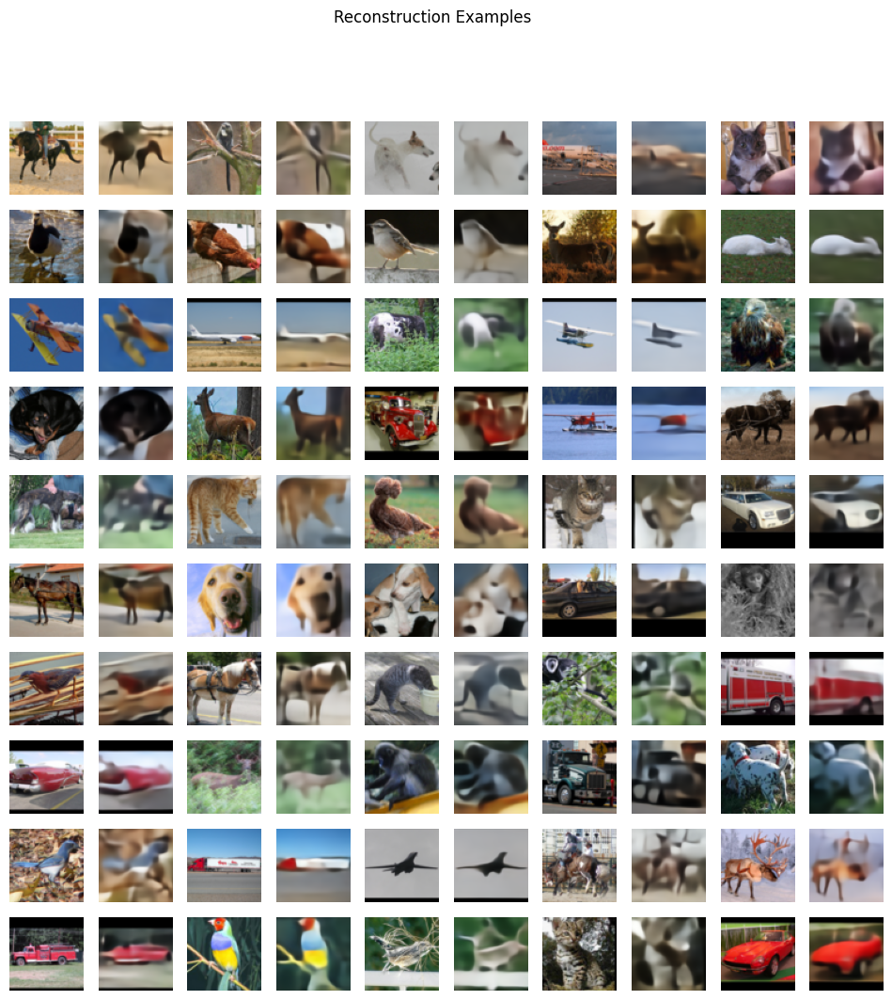

In [16]:
trainer.plot_examples()

## VQ-GAN RESULTS 

We have trained our VQ-GAN model with `gan_loss_scale = 0.1`. A slight improvement in the FID score was observed, it decreased from 120 to 110. However, the results are still blurry, and we believe this score can be further reduced by increasing the value of `gan_loss_scale`.


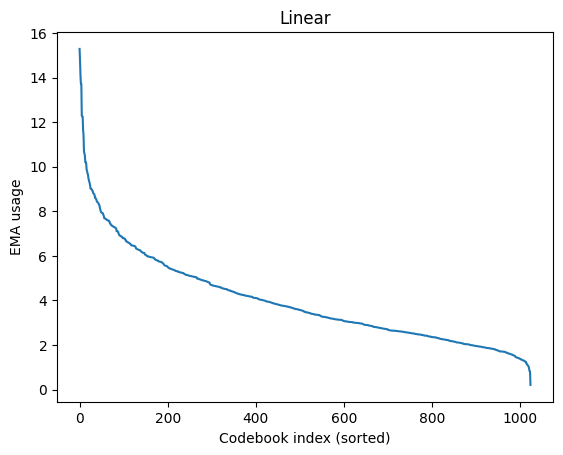

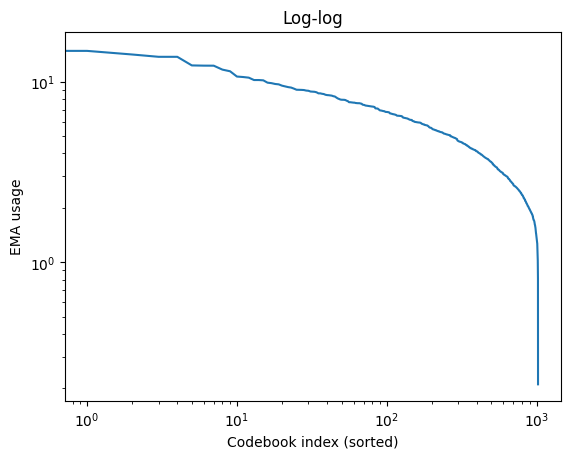

defaultdict(<class 'float'>, {'discriminator_loss': tensor(1.3556e-07, device='cuda:0'), 'commitment_loss': tensor(83.6334, device='cuda:0'), 'reconstruction_loss': tensor(560.8820, device='cuda:0'), 'generator_loss_classification': tensor(1.0000, device='cuda:0'), 'feature_matching_loss': tensor(0.3471, device='cuda:0')})


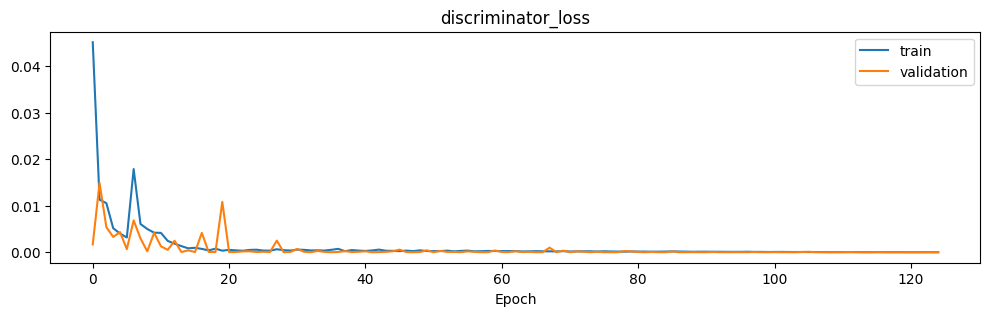

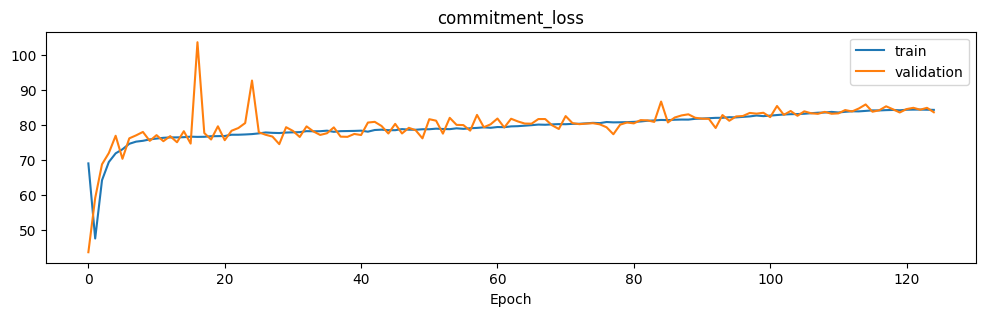

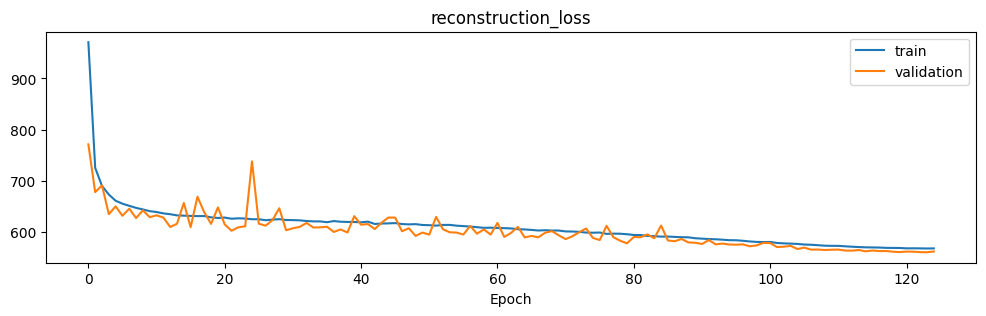

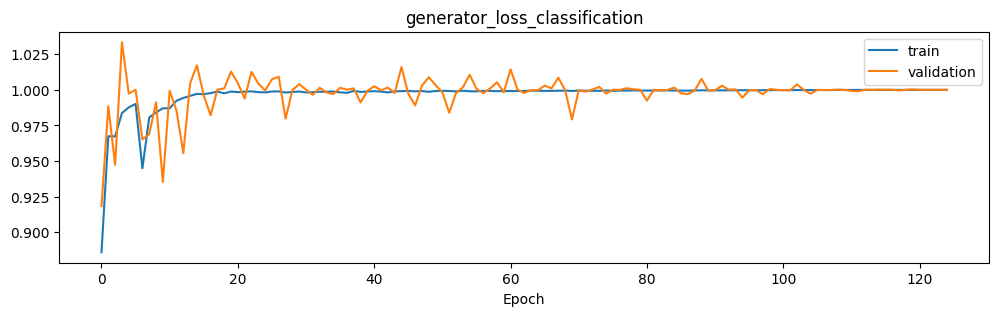

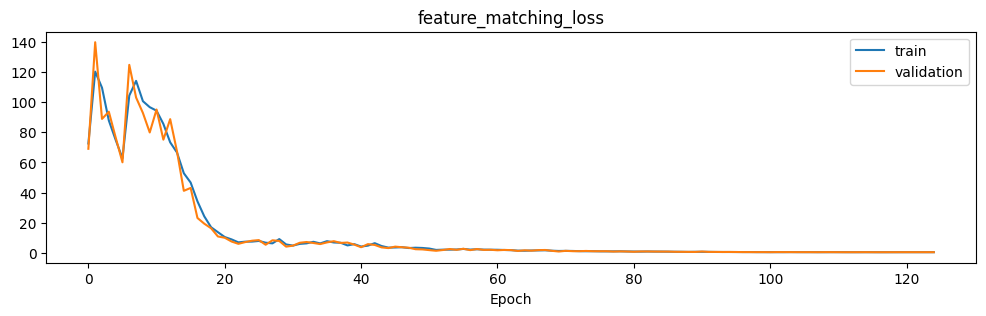

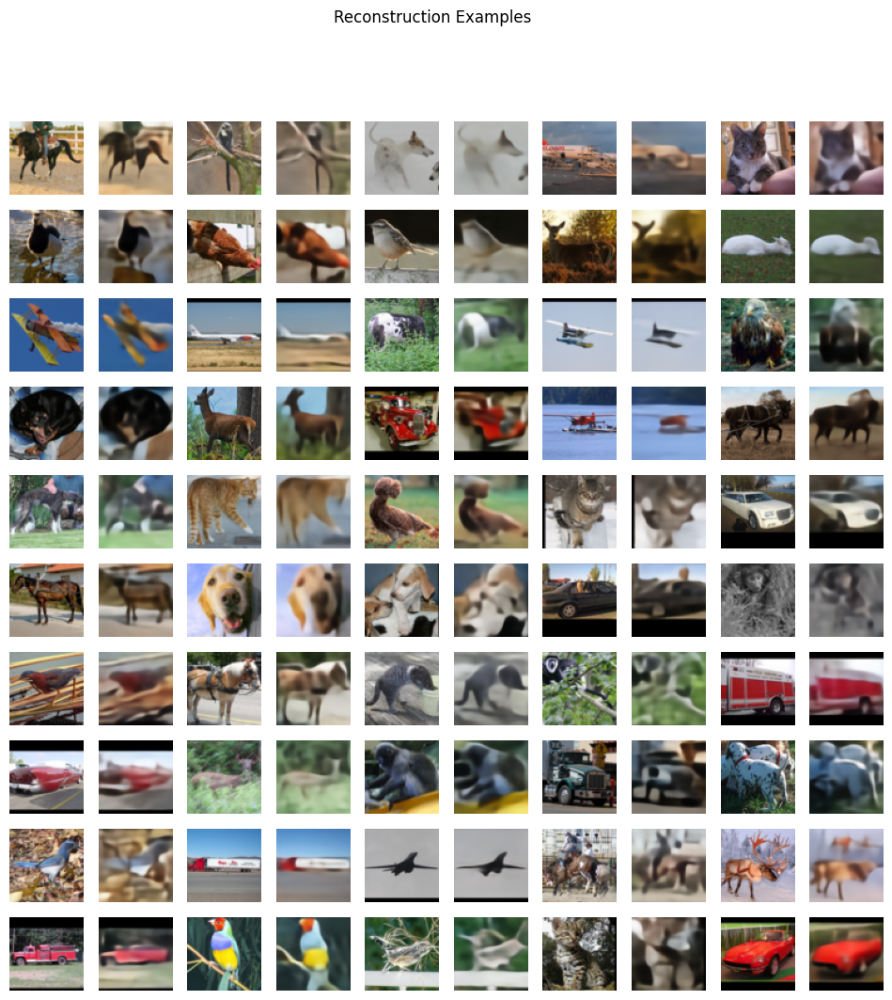

In [14]:
plt.plot(sorted(model.vqvae.quantizer.n_averages.cpu(), reverse=True))
plt.xlabel("Codebook index (sorted)")
plt.ylabel("EMA usage")
plt.title("Linear")
plt.show()

plt.loglog(sorted(model.vqvae.quantizer.n_averages.cpu(), reverse=True))
plt.xlabel("Codebook index (sorted)")
plt.ylabel("EMA usage")
plt.title("Log-log")
plt.show()


evaluation_results = gan_trainer.evaluate()
print(evaluation_results[1])
plot_learning_curves(gan_metrics, evaluation_results[1].keys())
gan_trainer.plot_examples()

## Saving the Model

We can save the full model state dict. Or we just save the VQVAE, portion, since we don't really need the discriminator anymore.
Note, it would be very convenient to simply save the *model* instead of just the weights.
Saving the weights requires us to re-build the model in the exact same way to be able to load the weights, which is cumbersome.
In principle, there is [torch export](https://docs.pytorch.org/docs/stable/export.html) to export full models.
But I didn't yet have time to look into this.
I had originally been directed to [TorchScript](https://docs.pytorch.org/docs/stable/jit.html) by some colleagues, but this didn't work for the model structure, and is actually deprecated.
If you have time to try the export, let me know! :)

In [19]:
torch.save(model.state_dict(), "weights/vqgan_stl_patchgan_8x8_gan01.pt")
#model.load_state_dict(torch.load("weights/vqgan_stl_patchgan_8x8.pt"))  # example to load weights after building model

In [20]:
torch.save(model.vqvae.state_dict(), "weights/vqvae_stl_8x8_gan01.pt")

## Evaluation

The issue with adding a GAN loss is that the reconstruction loss will usually go up, even if the reconstructions subjectively look better.
A better metric may be supplied by FID.
We provide a special version that evaluates _reconstructions_ rather than generated images.
Since we don't have a classifier for datasets like STL or Flickr, we can use the "proper" way of upsampling to ImageNet size and using a pretrained ImageNet classifier.
In this case I just use a Resnet rather than an InceptionNet.
The main thing is just to use the same network for all comparisons.

We use a bit of a hack to skip the classification layer, since we want to extract the _features_ from the resnet. By replacing the final fully-connected layer by an identity, the pre-final layer features are passed through to the end.

In [15]:
feature_extractor = get_resnet().to(device)

#### VQ-VAE

In [20]:
fid_eval = fid_reconstructions(feature_extractor, model.vqvae, test_dataloader, use_tqdm=True)
print(f"Reconstruction FID (lower is better): {fid_eval:.3f}")






Computing real & reconstructed features:   0%|          | 0/32 [00:00<?, ?it/s]

Reconstruction FID (lower is better): 121.001


#### VQ-GAN gan_loss_scale = 0.1

In [17]:
fid_eval = fid_reconstructions(feature_extractor, model.vqvae, test_dataloader, use_tqdm=True)
print(f"VG-GAN (gan-loss= 0.1) Reconstruction FID (lower is better): {fid_eval:.3f}")


Computing real & reconstructed features:   0%|          | 0/125 [00:00<?, ?it/s]

VG-GAN (gan-loss= 0.1) Reconstruction FID (lower is better): 110.601


# VQ-GAN

## Bonus

Can you think of a way to _generate_ images from the VQVAE? Bonusbonus: Implement it and try it out. Does it work well?